In [56]:
import pandas as pd
import bamboolib as bam
import csv
import requests
from capstonefunc import api

if __name__ == '__main__':
    crime = api('https://data.boston.gov/api/3/action/datastore_search?resource_id=b973d8cb-eeb2-4e7e-99da-c92938efc9c0&limit=100000')
    print(crime.dtypes)
    crime[['SHOOTING', 'OFFENSE_CODE','MONTH','HOUR','YEAR','INCIDENT_NUMBER']] = crime[['SHOOTING', 'OFFENSE_CODE','MONTH','HOUR','YEAR','INCIDENT_NUMBER']].astype({'SHOOTING' : int, 'OFFENSE_CODE': int,'MONTH' : int,'HOUR': int,'YEAR' : int,'INCIDENT_NUMBER': int})
    crime[['Lat', 'Long','OFFENSE_CODE_GROUP','UCR_PART']] = crime[['Lat', 'Long','OFFENSE_CODE_GROUP','UCR_PART']].astype({'Lat' : float, 'Long' : float,'OFFENSE_CODE_GROUP': float,'UCR_PART': float})
    print(crime.dtypes)


STREET                  object
OFFENSE_DESCRIPTION     object
SHOOTING                 int64
OFFENSE_CODE             int64
DISTRICT                object
REPORTING_AREA          object
OCCURRED_ON_DATE        object
DAY_OF_WEEK             object
MONTH                    int64
HOUR                     int64
Long                   float64
YEAR                     int64
Lat                    float64
INCIDENT_NUMBER          int64
_id                      int64
OFFENSE_CODE_GROUP     float64
UCR_PART               float64
Location                object
dtype: object
STREET                  object
OFFENSE_DESCRIPTION     object
SHOOTING                 int32
OFFENSE_CODE             int32
DISTRICT                object
REPORTING_AREA          object
OCCURRED_ON_DATE        object
DAY_OF_WEEK             object
MONTH                    int32
HOUR                     int32
Long                   float64
YEAR                     int32
Lat                    float64
INCIDENT_NUMBER          

In [57]:
crime

                                                  STREET  \
0                                              POPLAR ST   
1                                              CENTRE ST   
2                                          WASHINGTON ST   
3                                             SUDBURY ST   
4                                              GIBSON ST   
...                                                  ...   
15917                                        BISMARCK ST   
15918                                     NEW SUDBURY ST   
15919  CASTLE CT & E BERKELEY ST\nBOSTON  MA 02118\nU...   
15920  TREMONT ST & OAK ST W\nBOSTON  MA 02116\nUNITE...   
15921                                          SCHOOL ST   

                         OFFENSE_DESCRIPTION  SHOOTING  OFFENSE_CODE DISTRICT  \
0                         LARCENY ALL OTHERS         0           619       E5   
1            HARASSMENT/ CRIMINAL HARASSMENT         0          2670       E5   
2            FRAUD - CREDIT CARD / A

In [58]:
crime.columns

Index(['STREET', 'OFFENSE_DESCRIPTION', 'SHOOTING', 'OFFENSE_CODE', 'DISTRICT',
       'REPORTING_AREA', 'OCCURRED_ON_DATE', 'DAY_OF_WEEK', 'MONTH', 'HOUR',
       'Long', 'YEAR', 'Lat', 'INCIDENT_NUMBER', '_id', 'OFFENSE_CODE_GROUP',
       'UCR_PART', 'Location'],
      dtype='object')

In [59]:
print(crime.head(10))

           STREET              OFFENSE_DESCRIPTION  SHOOTING  OFFENSE_CODE  \
0       POPLAR ST               LARCENY ALL OTHERS         0           619   
1       CENTRE ST  HARASSMENT/ CRIMINAL HARASSMENT         0          2670   
2   WASHINGTON ST  FRAUD - CREDIT CARD / ATM FRAUD         0          1106   
3      SUDBURY ST               INVESTIGATE PERSON         0          3115   
4       GIBSON ST                 PROPERTY - FOUND         0          3207   
5       GIBSON ST                     FRAUD - WIRE         0          1109   
6       GIBSON ST                 PROPERTY - FOUND         0          3207   
7       GIBSON ST                 PROPERTY - FOUND         0          3207   
8    HARRISON AVE  HARASSMENT/ CRIMINAL HARASSMENT         0          2670   
9  TOPLIFF STREET                      SICK ASSIST         0          1831   

  DISTRICT REPORTING_AREA        OCCURRED_ON_DATE DAY_OF_WEEK  MONTH  HOUR  \
0       E5            680  2023-01-01 00:00:00+00      Sunday  

In [60]:
crime = crime.drop(columns=['OFFENSE_CODE_GROUP','UCR_PART','_id'])

In [61]:
crime

                                                  STREET  \
0                                              POPLAR ST   
1                                              CENTRE ST   
2                                          WASHINGTON ST   
3                                             SUDBURY ST   
4                                              GIBSON ST   
...                                                  ...   
15917                                        BISMARCK ST   
15918                                     NEW SUDBURY ST   
15919  CASTLE CT & E BERKELEY ST\nBOSTON  MA 02118\nU...   
15920  TREMONT ST & OAK ST W\nBOSTON  MA 02116\nUNITE...   
15921                                          SCHOOL ST   

                         OFFENSE_DESCRIPTION  SHOOTING  OFFENSE_CODE DISTRICT  \
0                         LARCENY ALL OTHERS         0           619       E5   
1            HARASSMENT/ CRIMINAL HARASSMENT         0          2670       E5   
2            FRAUD - CREDIT CARD / A

In [62]:
from capstonefunc import fill_missing_values

crime = fill_missing_values(crime, 'DISTRICT', 'mode')


In [63]:
district_means = crime.groupby('DISTRICT')[['Lat', 'Long']].mean()
crime[['Lat', 'Long']] = crime.groupby('DISTRICT')[['Lat', 'Long']].transform(lambda x: x.fillna(x.mean()))


In [34]:
crime

       STREET                    OFFENSE_DESCRIPTION  SHOOTING  OFFENSE_CODE  \
0        2479                     LARCENY ALL OTHERS         0            13   
1         646        HARASSMENT/ CRIMINAL HARASSMENT         0            56   
2        3156        FRAUD - CREDIT CARD / ATM FRAUD         0            23   
3        2862                     INVESTIGATE PERSON         0            73   
4        1422                       PROPERTY - FOUND         0            83   
...       ...                                    ...       ...           ...   
15917     334                     INVESTIGATE PERSON         0            73   
15918    2275          SICK/INJURED/MEDICAL - PERSON         0            62   
15919     617     SICK ASSIST - DRUG RELATED ILLNESS         0            36   
15920    2970  M/V - LEAVING SCENE - PROPERTY DAMAGE         0           104   
15921    2725                     INVESTIGATE PERSON         0            73   

       DISTRICT REPORTING_AREA        O

In [64]:
crime['Location'] = crime.apply(lambda row: f'({row["Lat"]}, {row["Long"]})' if pd.isna(row["Location"]) else row["Location"], axis=1)


In [27]:
crime

       STREET                    OFFENSE_DESCRIPTION  SHOOTING  OFFENSE_CODE  \
0        2479                     LARCENY ALL OTHERS         0            13   
1         646        HARASSMENT/ CRIMINAL HARASSMENT         0            56   
2        3156        FRAUD - CREDIT CARD / ATM FRAUD         0            23   
3        2862                     INVESTIGATE PERSON         0            73   
4        1422                       PROPERTY - FOUND         0            83   
...       ...                                    ...       ...           ...   
15917     334                     INVESTIGATE PERSON         0            73   
15918    2275          SICK/INJURED/MEDICAL - PERSON         0            62   
15919     617     SICK ASSIST - DRUG RELATED ILLNESS         0            36   
15920    2970  M/V - LEAVING SCENE - PROPERTY DAMAGE         0           104   
15921    2725                     INVESTIGATE PERSON         0            73   

       DISTRICT REPORTING_AREA        O

In [65]:
!pip install folium
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import KMeans


# Group data by location
grouped_data = crime.groupby(['Lat', 'Long']).size().reset_index(name='count')

# Define clusters
num_clusters = 5
cluster_data = grouped_data[['Lat', 'Long']]
kmeans = KMeans(n_clusters=num_clusters).fit(cluster_data)
grouped_data['cluster'] = kmeans.labels_

# Create map
crime_map = folium.Map(location=[grouped_data['Lat'].mean(), grouped_data['Long'].mean()], zoom_start=12)

# Add cluster markers
marker_cluster = MarkerCluster().add_to(crime_map)
for i, row in grouped_data.iterrows():
    popup_text = "Location: {},{}<br>Number of Crimes: {}".format(row['Lat'], row['Long'], row['count'])
    folium.Marker(location=[row['Lat'], row['Long']], popup=popup_text).add_to(marker_cluster)

# Show map
crime_map







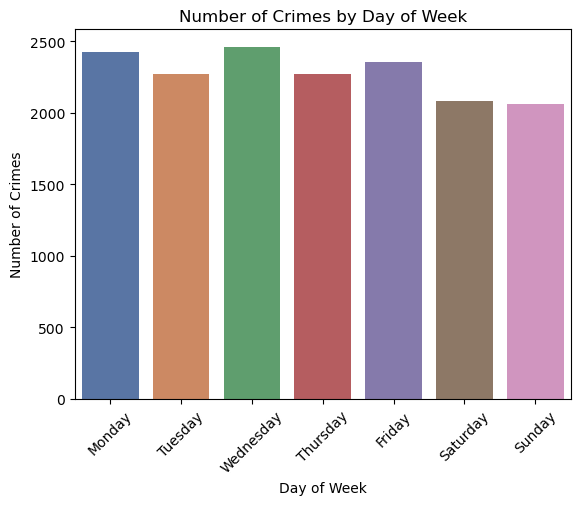

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# get the counts of each day of the week
day_counts = crime["DAY_OF_WEEK"].value_counts()

# define the order of days of the week
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# create a bar plot using seaborn
sns.barplot(x=day_order, y=day_counts.loc[day_order], palette="deep")

# set the title and axis labels
plt.title("Number of Crimes by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Number of Crimes")

plt.xticks(rotation=45)


# show the plot
plt.show()






In [20]:
# Filter shooting incidents
shooting_data = crime[crime["SHOOTING"] == 1]

# Create a folium map centered on Boston
map_shooting = folium.Map(location=[42.361145, -71.057083], zoom_start=12)

# Add markers for each shooting incident with district name as hover
for index, row in shooting_data.iterrows():
    folium.Marker(location=[row['Lat'], row['Long']], 
                  popup=row['STREET'], 
                  icon=folium.Icon(color='red')).add_to(map_shooting)

# Display the map
map_shooting

In [9]:
! pip install squarify
import plotly.express as px
import squarify


# Get the top 5 offense descriptions
top_offense_desc = crime['OFFENSE_DESCRIPTION'].value_counts().nlargest(5).index.tolist()

# Filter the data to only include the top 5 offense descriptions
top_crime_data = crime[crime['OFFENSE_DESCRIPTION'].isin(top_offense_desc)]

# Create the treemap figure
fig = px.treemap(top_crime_data, 
                 path=['OFFENSE_DESCRIPTION'], 
                 color='OFFENSE_DESCRIPTION',
                 color_discrete_sequence=px.colors.qualitative.Vivid,
                 hover_data={'OFFENSE_DESCRIPTION': True})

# Update the layout
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))

# Show the figure
fig.show()




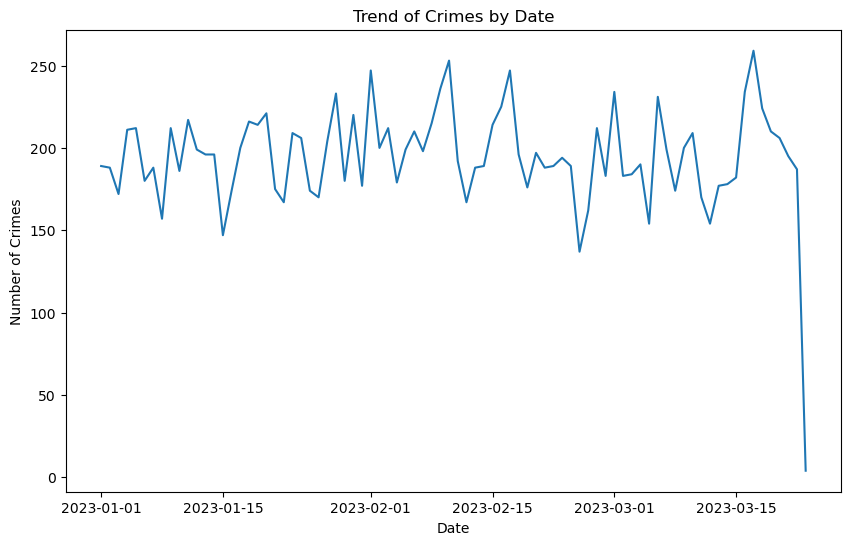

In [12]:
# Convert OCCURRED_ON_DATE column to datetime type
crime['OCCURRED_ON_DATE'] = pd.to_datetime(crime['OCCURRED_ON_DATE'])

# Group by date and count the number of crimes on each date
crimes_by_date = crime.groupby(crime['OCCURRED_ON_DATE'].dt.date).size()

# Create a line plot of the data
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(crimes_by_date.index, crimes_by_date.values)

# Set plot title and labels
ax.set_title('Trend of Crimes by Date')
ax.set_xlabel('Date')
ax.set_ylabel('Number of Crimes')

# Show plot
plt.show()



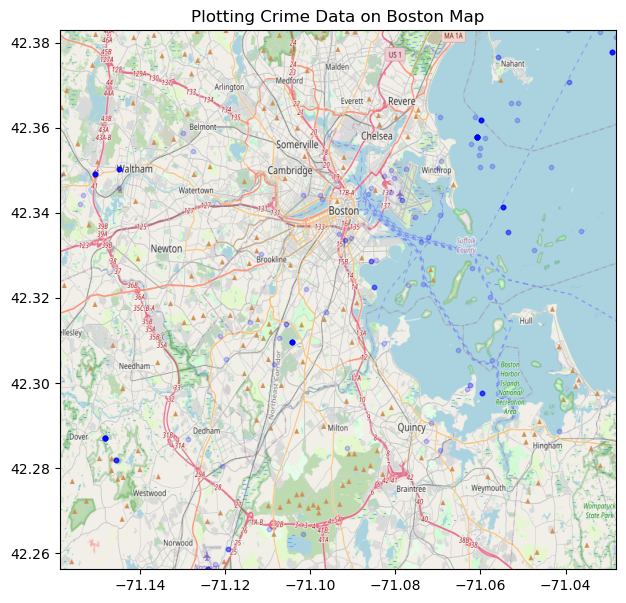

In [8]:
from capstonefunc import culmap

if __name__ == '__main__':
    culmap(crime,'ROBBERY')

Decision Tree to predict shooting

In [48]:
# importing required libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn import tree

# loading the data
df = crime

# encoding categorical variables
le = LabelEncoder()
df['DISTRICT'] = le.fit_transform(df['DISTRICT'])
df['DAY_OF_WEEK'] = le.fit_transform(df['DAY_OF_WEEK'])
df['STREET'] = le.fit_transform(df['STREET'])

# selecting the features and target variable
X = df[['DISTRICT', 'DAY_OF_WEEK', 'HOUR', 'STREET']]
y = df['SHOOTING']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

class_weights = {0: 0.1, 1: 0.9}

# building the decision tree classifier
dtc = DecisionTreeClassifier(criterion="gini", random_state=42,max_depth=3, min_samples_leaf=5, class_weight=class_weights )   

dtc.fit(X_train, y_train)

# making predictions on the testing set
y_pred = dtc.predict(X_test)

# calculating the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy*100))



Accuracy: 99.12%


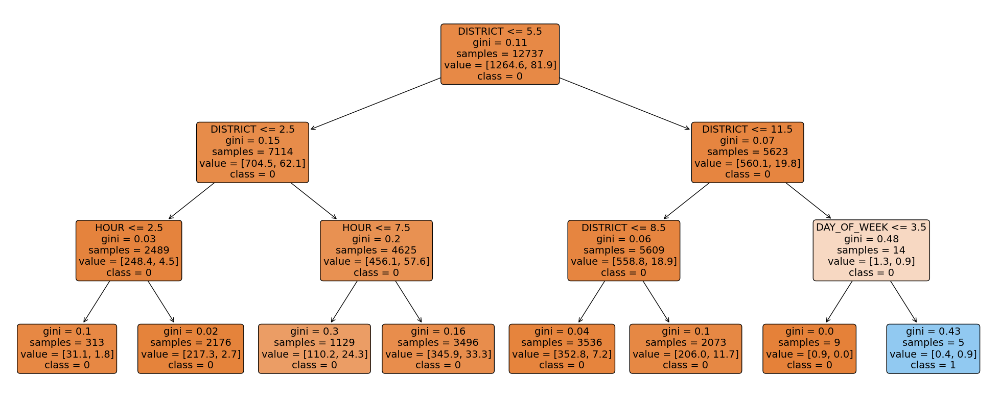

In [50]:
plt.figure(figsize = (25,10))
plot=tree.plot_tree(dtc,feature_names = X.columns.values.tolist(),class_names=['0','1'],filled = True,rounded = True,fontsize = 14,precision=2)

In [49]:
#Confusion Matrix

from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[3157    1]
 [  27    0]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3158
           1       0.00      0.00      0.00        27

    accuracy                           0.99      3185
   macro avg       0.50      0.50      0.50      3185
weighted avg       0.98      0.99      0.99      3185



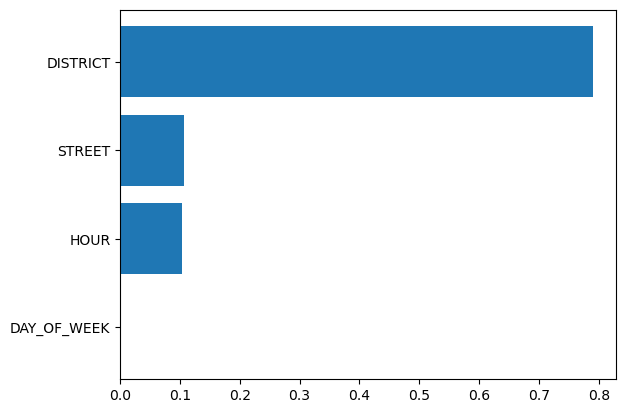

In [38]:
#Feature Importance
import numpy as np

importances = dtc.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_train.columns)[indices])